# Mock Challenge Level 2 SpectorPhotometry--- `provabgs` mocks

In [1]:
import os
import pickle
import numpy as np 
# --- plotting --- 
import corner as DFM
import matplotlib as mpl
import matplotlib.pyplot as plt
#if 'NERSC_HOST' not in os.environ.keys():
#    mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['axes.xmargin'] = 1
mpl.rcParams['xtick.labelsize'] = 'x-large'
mpl.rcParams['xtick.major.size'] = 5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.labelsize'] = 'x-large'
mpl.rcParams['ytick.major.size'] = 5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['legend.frameon'] = False

In [2]:
import gqp_mc.util as UT

In [3]:
from provabgs import infer as Infer
from provabgs import models as Models

# read mock spectra

In [4]:
theta_obs = pickle.load(open('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/l2.theta.p', 'rb'))

wave_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.wave.npy')
flux_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.flux.npy')
ivar_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_s2.ivar.npy')

photo_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_p2.flux.npy')
photo_ivar_obs = np.load('/global/cscratch1/sd/chahah/gqp_mc/mini_mocha/mocha_p2.ivar.npy')

(0.0, 20)

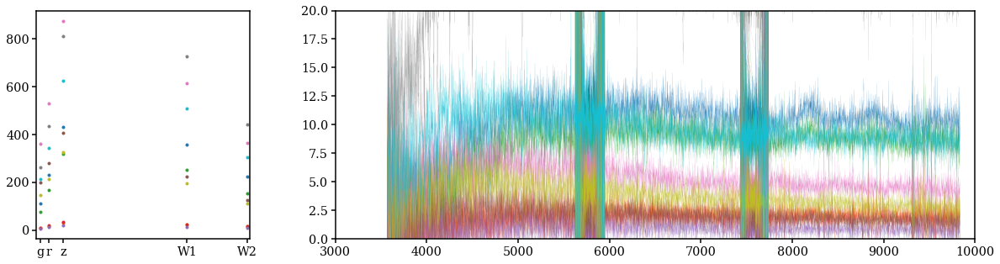

In [5]:
fig = plt.figure(figsize=(20,5))
gs2 = fig.add_gridspec(nrows=1, ncols=2, width_ratios=[1,3])#, top=0.17, bottom=0.05)
sub1 = fig.add_subplot(gs2[0,0]) 
sub2 = fig.add_subplot(gs2[0,1]) 
for ii, f, i in zip(range(10), photo_obs, photo_ivar_obs): 
    sub1.errorbar([4720., 6415., 9260., 34000, 46000.], f[:5], yerr=i[:5]**-0.5, fmt='.C%i' % ii)
sub1.set_xlim(4000, 46500)
sub1.set_xticks([4720., 6415., 9260., 34000, 46000.])
sub1.set_xticklabels(['g', 'r', 'z', 'W1', 'W2'])

for ii, f in zip(range(10), flux_obs): 
    sub2.plot(wave_obs, flux_obs[ii], lw=0.1, c='C%i' % ii)
sub2.set_xlim(3e3, 1e4)
sub2.set_ylim(0., 20)

# load in MCMC chains run on cori

In [6]:
prior = Infer.load_priors([
    Infer.UniformPrior(7.5, 12.5, label='sed'), 
    Infer.FlatDirichletPrior(4, label='sed'),   # flat dirichilet priors
    Infer.UniformPrior(0., 1., label='sed'), # burst fraction
    Infer.LogUniformPrior(1e-2, 13.27, label='sed'), # tburst
    Infer.LogUniformPrior(4.5e-5, 4.5e-2, label='sed'),# uniform priors on ZH coeffb
    Infer.LogUniformPrior(4.5e-5, 4.5e-2, label='sed'),# uniform priors on ZH coeff
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust1 
    Infer.UniformPrior(0., 3., label='sed'),        # uniform priors on dust2
    Infer.UniformPrior(-2, 1, label='sed')     # uniform priors on dust_index 
])

m_nmf = Models.NMF(burst=True, emulator=True)

desi_mcmc = Infer.desiMCMC(model=m_nmf, prior=prior)

input parameters : logmstar, beta1_sfh, beta2_sfh, beta3_sfh, beta4_sfh, fburst, tburst, gamma1_zh, gamma2_zh, dust1, dust2, dust_index


In [7]:
chain_dir = os.path.join(UT.dat_dir(), 'mini_mocha', 'L2')
f_chain = lambda i: os.path.join(chain_dir, 'SP2.provabgs.%i.chain.p' % i)

In [8]:
igals, chains = [], []
for i in range(3000): 
    if os.path.isfile(f_chain(i)): 
        igals.append(i)
        chains.append(pickle.load(open(f_chain(i), 'rb')))

In [9]:
print(len(igals))

2123


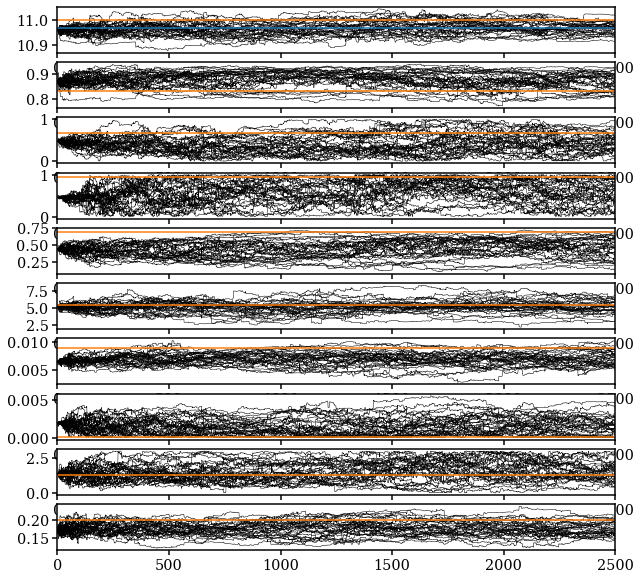

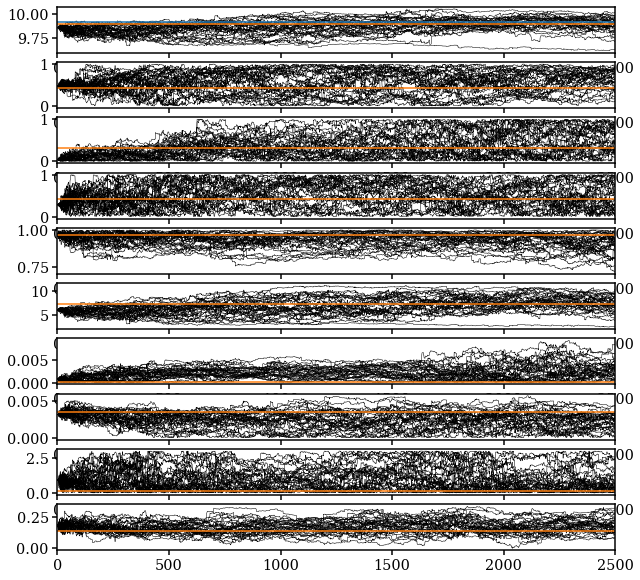

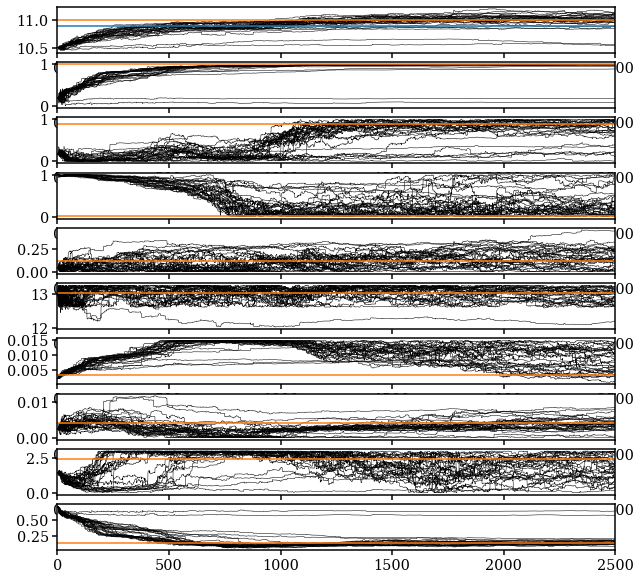

In [10]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'][:-1])
    fig = plt.figure(figsize=(10, 10))
    for ii in range(unt_theta_bf.shape[0]-1): 
        sub = fig.add_subplot(unt_theta_bf.shape[0]-1, 1, ii+1)
        for j in range(30): 
            unt_chain_i = desi_mcmc.prior.untransform(chain['mcmc_chain'][:,j,:-1])
            sub.plot(unt_chain_i[:,ii], c='k', lw=0.5)
        if ii == 0: 
            sub.axhline(theta_obs['logM_total'][i])
        sub.axhline(unt_theta_bf[ii], color='C1')
        sub.set_xlim(0,2500)

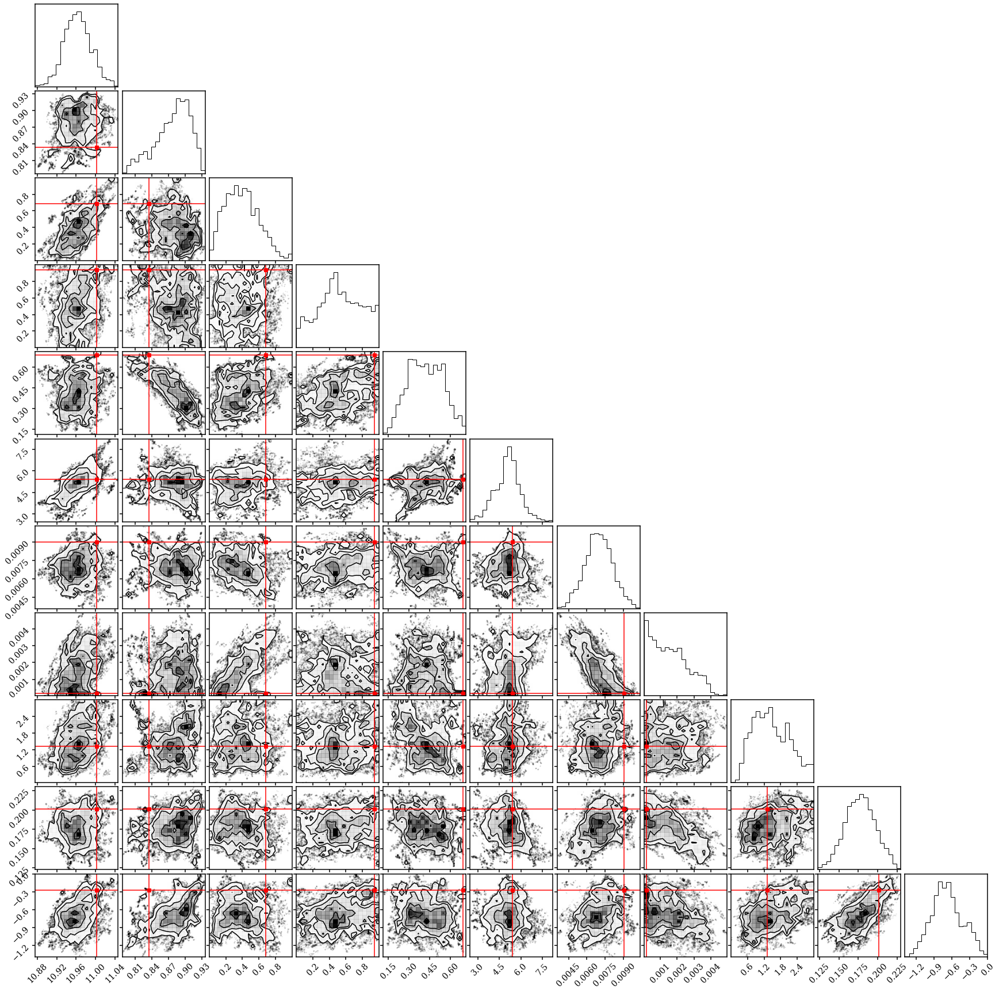

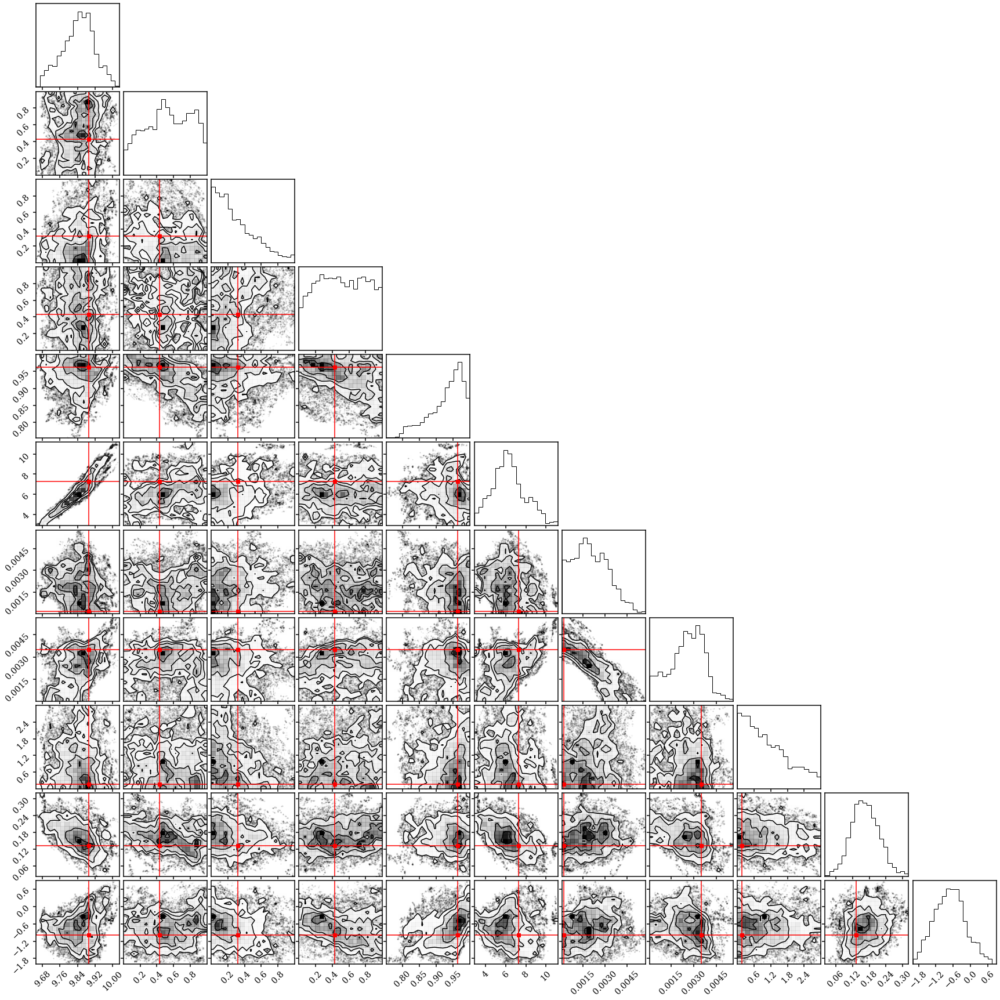

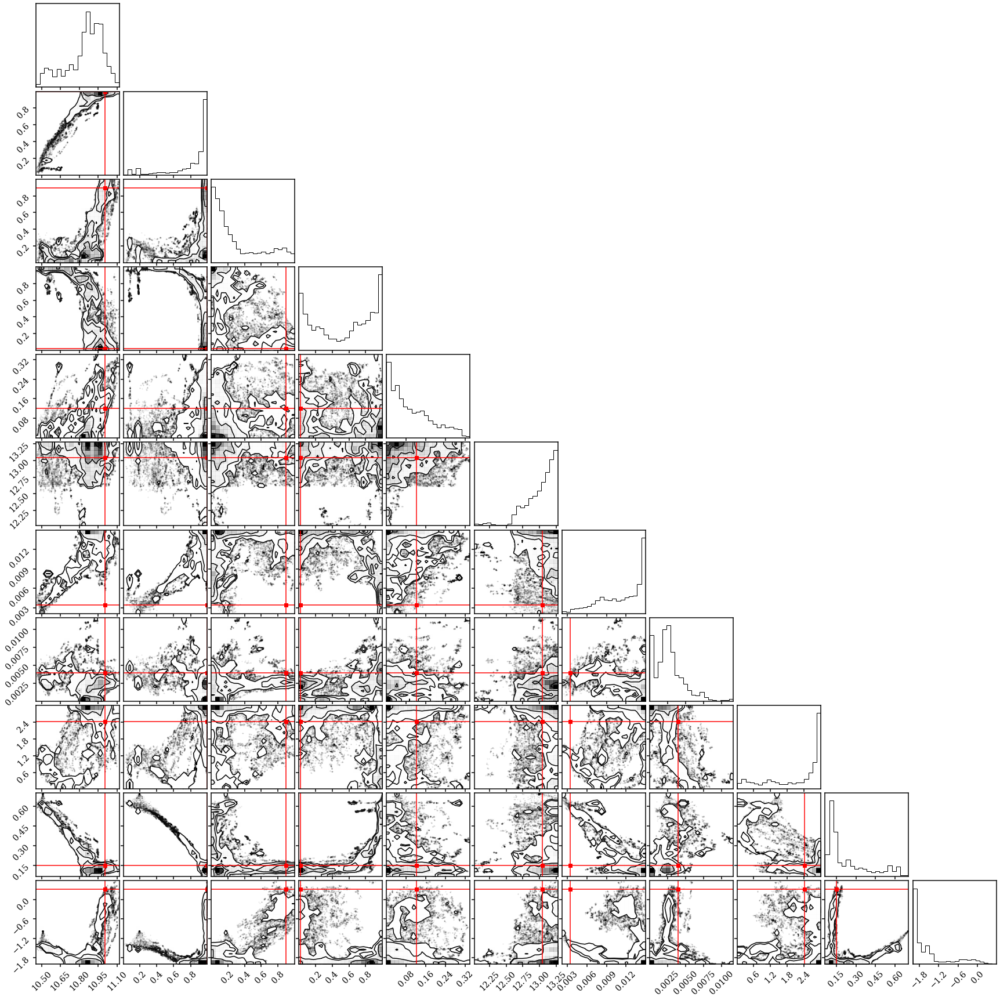

In [11]:
# examine the chains     
for i, chain in zip(igals[:3], chains): 
    unt_theta_bf = prior.untransform(chain['theta_bestfit'][:-1])
    unt_chain = prior.untransform(desi_mcmc._flatten_chain(chain['mcmc_chain'][:1500,:,:-1]))
    
    fig = DFM.corner(unt_chain)
    
    axes = np.array(fig.axes).reshape((unt_theta_bf.shape[0], unt_theta_bf.shape[0]))

    # Loop over the histograms
    for yi in range(unt_theta_bf.shape[0]):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.axvline(unt_theta_bf[xi], color="r")
            ax.axhline(unt_theta_bf[yi], color="r")
            ax.plot(unt_theta_bf[xi], unt_theta_bf[yi], "sr")

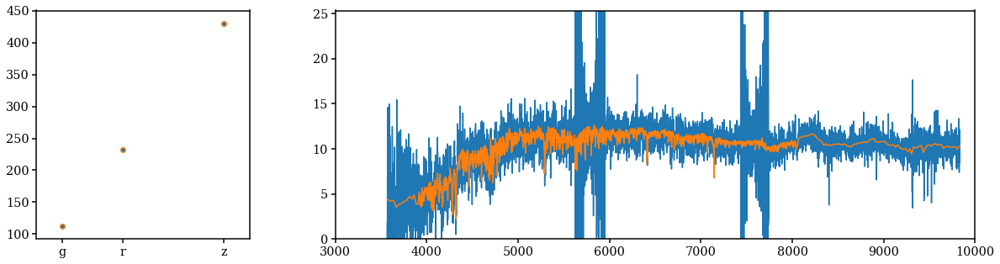

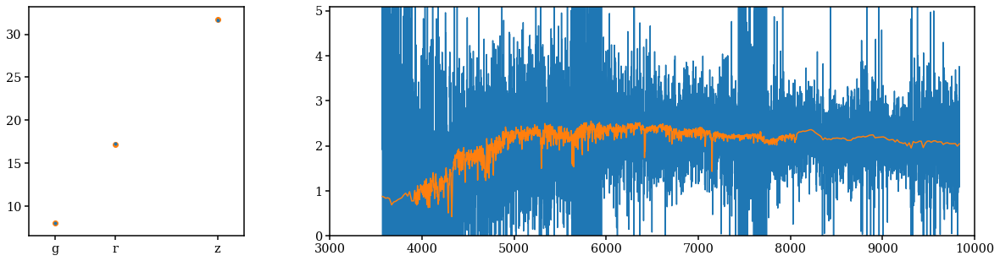

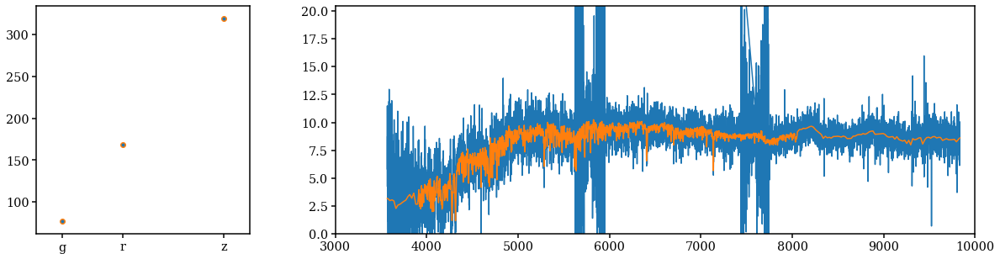

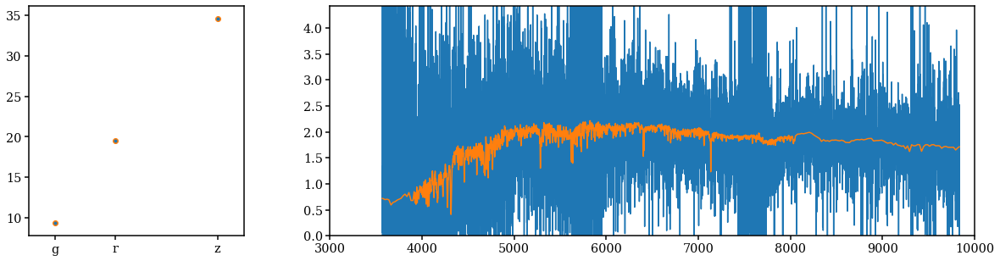

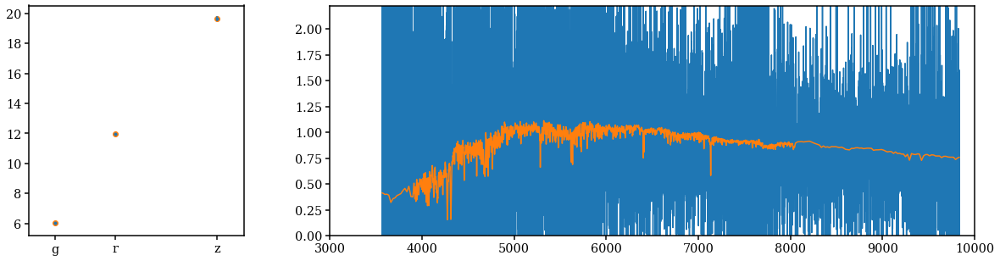

In [12]:
# examine the chains     
for i, igal in enumerate(igals[:5]):
    fig = plt.figure(figsize=(20,5))
    gs2 = fig.add_gridspec(nrows=1, ncols=2, width_ratios=[1,3])#, top=0.17, bottom=0.05)
    sub1 = fig.add_subplot(gs2[0,0]) 
    sub2 = fig.add_subplot(gs2[0,1]) 
    sub1.errorbar([4720., 6415., 9260.], photo_obs[igal][:3], yerr=photo_ivar_obs[igal][:3]**-0.5, fmt='.C0')
    sub1.scatter([4720., 6415., 9260.], chains[i]['flux_photo_model'], c='C1')
    sub1.set_xlim(4000, 1e4)
    sub1.set_xticks([4720., 6415., 9260])
    sub1.set_xticklabels(['g', 'r', 'z'])


    sub2.plot(wave_obs, flux_obs[igal], c='C0')
    sub2.plot(chain['wavelength_obs'], chains[i]['flux_spec_model'], c='C1')
    sub2.set_xlim(3e3, 1e4)
    sub2.set_ylim(0., 2. * np.max(chains[i]['flux_spec_model']))

In [13]:
flat_chains = []
logMstar_true, logMstar_inf = [], [] 
logSSFR_true, logSSFR_inf = [], [] 
logZ_MW_true, logZ_MW_inf = [], []
tage_MW_true, tage_MW_inf = [], [] 
tauism_true, tauism_inf = [], [] 

for i, chain in zip(igals, chains): 
    flat_chain = desi_mcmc._flatten_chain(chain['mcmc_chain'][1500:,:,:-1])       
    flat_chains.append(flat_chain)
    
    z_obs = theta_obs['redshift'][i]
    
    logMstar_true.append(theta_obs['logM_total'][i])
    logMstar_inf.append(flat_chain[:,0])
    
    logSSFR_true.append(np.log10(theta_obs['sfr_1gyr'][i]) - theta_obs['logM_total'][i])
    logSSFR_inf.append(np.log10(m_nmf.avgSFR(flat_chain, zred=z_obs, dt=1.0)) - flat_chain[:,0])
    
    logZ_MW_true.append(np.log10(theta_obs['Z_MW'])[i])
    logZ_MW_inf.append(np.log10(m_nmf.Z_MW(flat_chain, zred=z_obs)))
    
    tage_MW_true.append(theta_obs['t_age_MW'][i])
    tage_MW_inf.append(m_nmf.tage_MW(flat_chain, zred=z_obs))
    
    tauism_true.append(theta_obs['tau_ism'][i])
    tauism_inf.append(flat_chain[:,-2])
    
flat_chains = np.array(flat_chains)

logMstar_true = np.array(logMstar_true)
logMstar_inf = np.array(logMstar_inf)

logSSFR_true = np.array(logSSFR_true).flatten()
logSSFR_inf = np.array(logSSFR_inf)

logZ_MW_true = np.array(logZ_MW_true).flatten()
logZ_MW_inf = np.array(logZ_MW_inf)

tage_MW_true = np.array(tage_MW_true).flatten()
tage_MW_inf = np.array(tage_MW_inf)

tauism_true = np.array(tauism_true)
tauism_inf = np.array(tauism_inf)

In [14]:
# lets calculate the median, +/- sigma for each of the derived properties
logm_q = np.array([DFM.quantile(logMstar_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logssfr_q = np.array([DFM.quantile(logSSFR_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
logzmw_q = np.array([DFM.quantile(logZ_MW_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
tagemw_q = np.array([DFM.quantile(tage_MW_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])
tauism_q = np.array([DFM.quantile(tauism_inf[i], [0.16, 0.5, 0.84]) for i in range(flat_chains.shape[0])])

(0.0, 3)

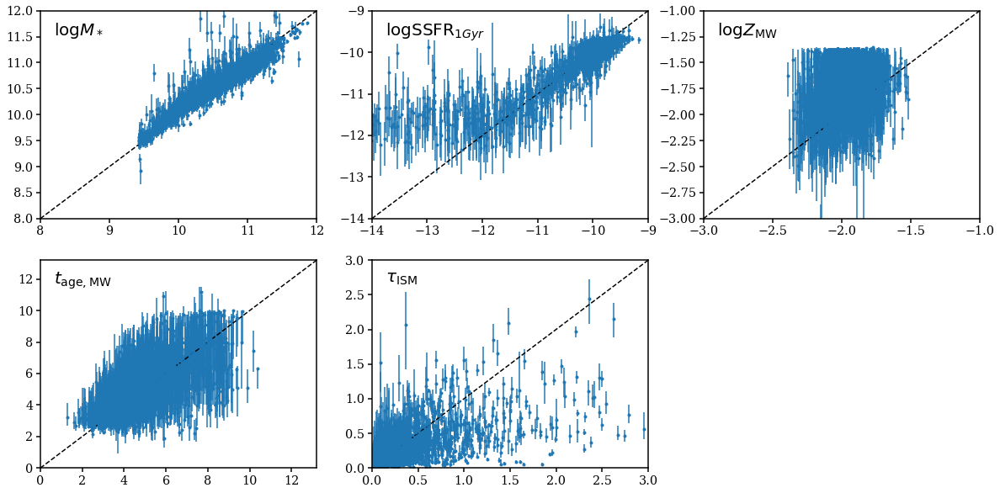

In [15]:
fig = plt.figure(figsize=(20,10))
sub = fig.add_subplot(231)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.plot([8., 12.], [8., 12], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log M_*$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(8., 12.)
sub.set_ylim(8., 12.)

sub = fig.add_subplot(232)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.text(0.05, 0.95, r'$\log {\rm SSFR}_{1Gyr}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(233)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\log Z_{\rm MW}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)

sub = fig.add_subplot(234)
sub.errorbar(tage_MW_true, tagemw_q[:,1], 
             yerr=[tagemw_q[:,1] - tagemw_q[:,0], tagemw_q[:,2] - tagemw_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$t_{\rm age, MW}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([0., 13.2], [0., 13.2], c='k', ls='--')
sub.set_xlim(0., 13.2)
sub.set_ylim(0., 13.2)

sub = fig.add_subplot(235)
sub.errorbar(tauism_true, tauism_q[:,1], 
             yerr=[tauism_q[:,1] - tauism_q[:,0], tauism_q[:,2] - tauism_q[:,1]], 
             fmt='.C0')
sub.text(0.05, 0.95, r'$\tau_{\rm ISM}$', transform=sub.transAxes, ha='left', va='top', fontsize=20)
sub.plot([0., 3.], [0., 3.], c='k', ls='--')
sub.set_xlim(0., 3)
sub.set_ylim(0., 3)

In [ ]:
for i in range(3): 
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-13, -9.), (-3., -1)])

For all of the spectra we're able to reproduce $M_*$. However, for some of the spectra, we seem to be just recovering the prior for $\log{\rm SSFR}$ and $\log Z_{\rm MW}$. Lets check: 
- the bestfit spectra are good fits to the data
- Is this due to inherent degeneracies in the model? 

In [17]:
bad_ssfr = (np.abs(logSSFR_true - logssfr_q[:,1]) > 1.) | (np.abs(logZ_MW_true - logzmw_q[:,1]) > 0.5)

(-3.0, -1)

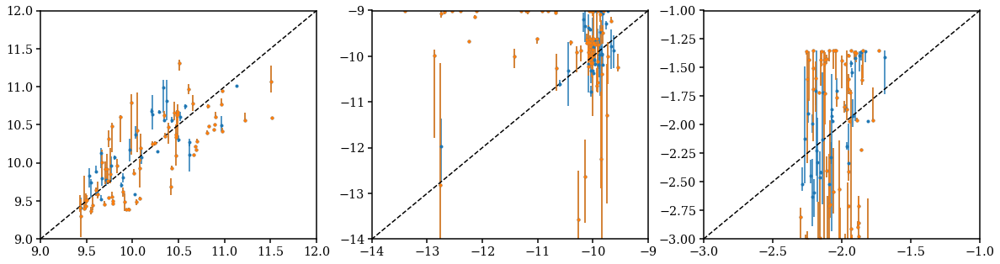

In [18]:
fig = plt.figure(figsize=(20, 5))
sub = fig.add_subplot(131)
sub.errorbar(logMstar_true, logm_q[:,1], 
             yerr=[logm_q[:,1]-logm_q[:,0], logm_q[:,2]-logm_q[:,1]],
             fmt='.C0')
sub.errorbar(logMstar_true[bad_ssfr], logm_q[bad_ssfr,1], 
             yerr=[logm_q[bad_ssfr,1]-logm_q[bad_ssfr,0], logm_q[bad_ssfr,2]-logm_q[bad_ssfr,1]],
             fmt='.C1')
sub.plot([9., 12.], [9., 12], c='k', ls='--')
sub.set_xlim(9., 12.)
sub.set_ylim(9., 12.)

sub = fig.add_subplot(132)
sub.errorbar(logSSFR_true, logssfr_q[:,1], 
             yerr=[logssfr_q[:,1]-logssfr_q[:,0], logssfr_q[:,2]-logssfr_q[:,1]], 
             fmt='.C0')
sub.errorbar(logSSFR_true[bad_ssfr], logssfr_q[bad_ssfr,1], 
             yerr=[logssfr_q[bad_ssfr,1]-logssfr_q[bad_ssfr,0], logssfr_q[bad_ssfr,2]-logssfr_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-9., -15.], [-9., -15], c='k', ls='--')
sub.set_xlim(-14, -9.)
sub.set_ylim(-14, -9.)

sub = fig.add_subplot(133)
sub.errorbar(logZ_MW_true, logzmw_q[:,1], 
             yerr=[logzmw_q[:,1] - logzmw_q[:,0], logzmw_q[:,2] - logzmw_q[:,1]], 
             fmt='.C0')
sub.errorbar(logZ_MW_true[bad_ssfr], logzmw_q[bad_ssfr,1], 
             yerr=[logzmw_q[bad_ssfr,1] - logzmw_q[bad_ssfr,0], logzmw_q[bad_ssfr,2] - logzmw_q[bad_ssfr,1]], 
             fmt='.C1')
sub.plot([-3., -1], [-3, -1], c='k', ls='--')
sub.set_xlim(-3., -1)
sub.set_ylim(-3., -1)

-10.166048877190246


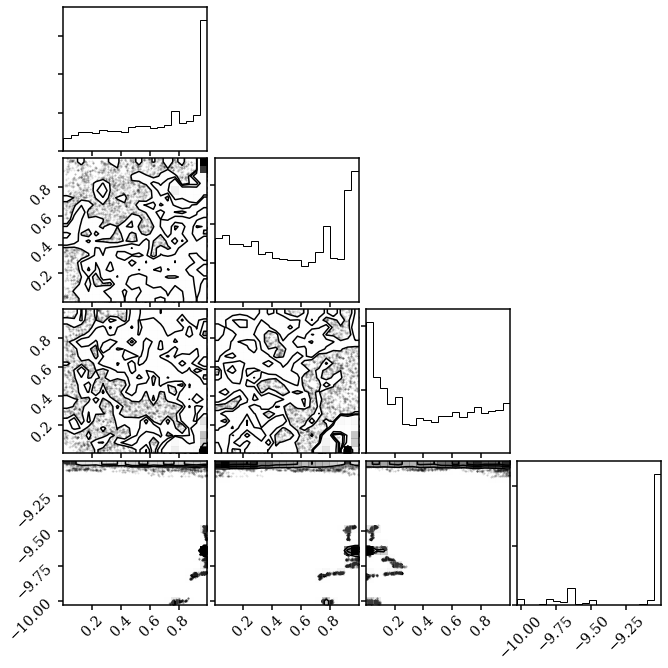

In [63]:
_ = DFM.corner(np.concatenate([prior.untransform(flat_chains[0])[:,1:4], np.atleast_2d(logSSFR_inf[0]).T], axis=1))
print(logSSFR_true[0])

0


2


3


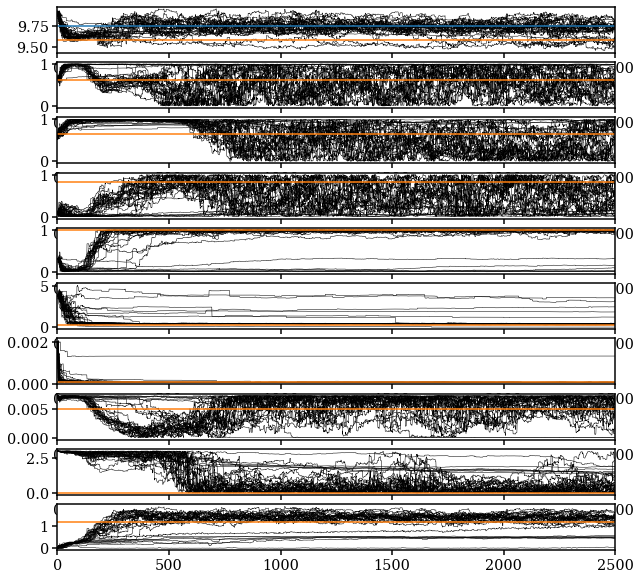

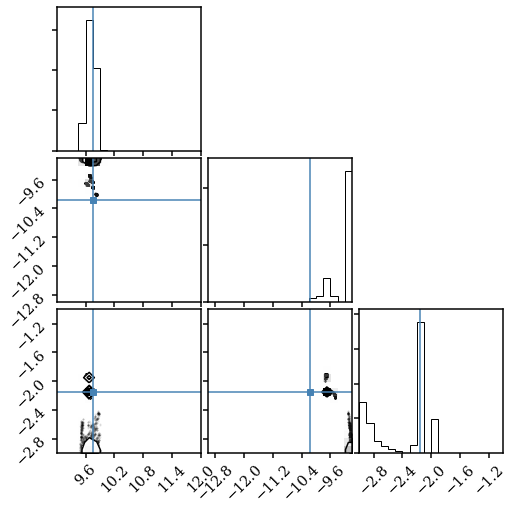

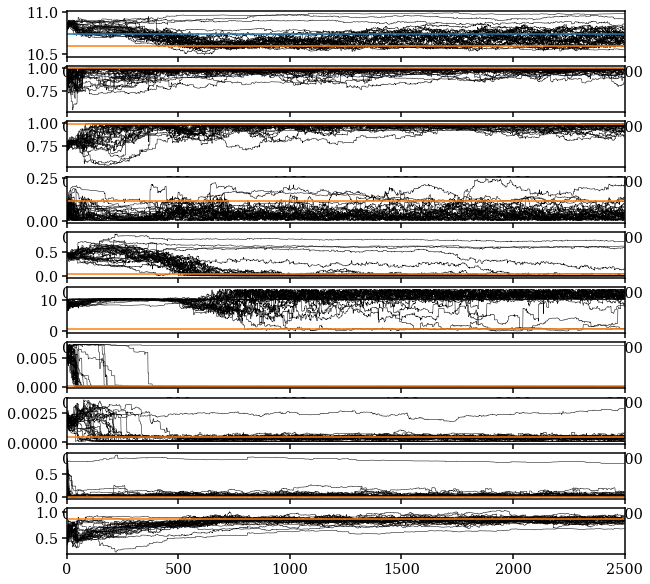

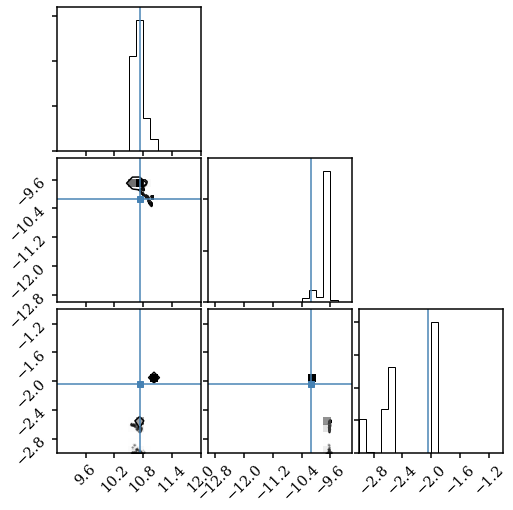

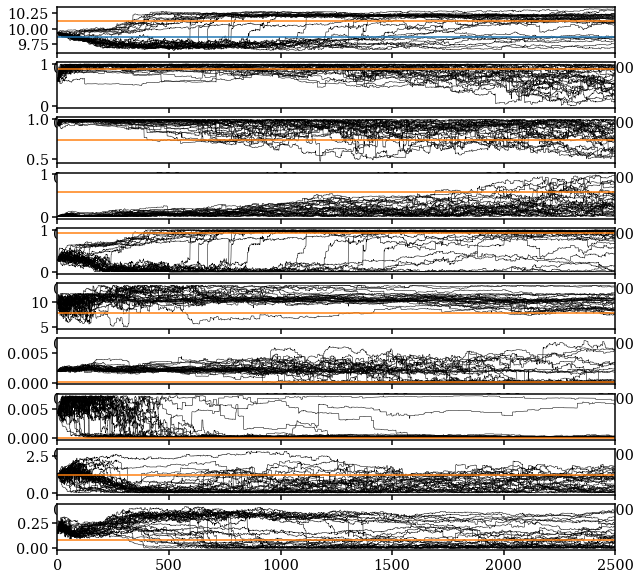

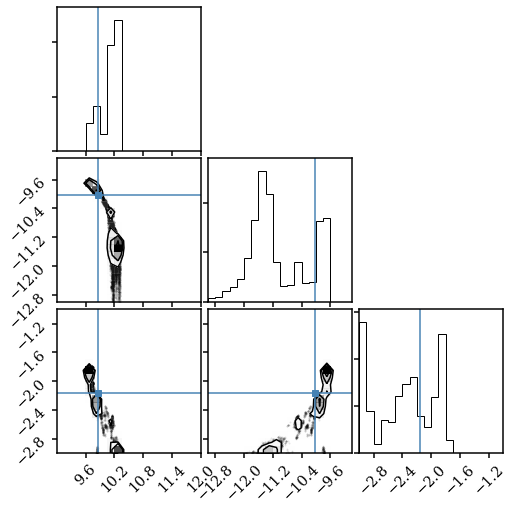

In [47]:
# examine the chains     
for i in np.arange(len(bad_ssfr))[bad_ssfr][:3]: 
    print(i)
    chain = chains[i]
    unt_theta_bf = prior.untransform(chain['theta_bestfit'][:-1])
    fig = plt.figure(figsize=(10, 10))
    for ii in range(unt_theta_bf.shape[0]-1): 
        sub = fig.add_subplot(unt_theta_bf.shape[0]-1, 1, ii+1)
        for j in range(30): 
            unt_chain_i = desi_mcmc.prior.untransform(chain['mcmc_chain'][:,j,:-1])
            sub.plot(unt_chain_i[:,ii], c='k', lw=0.5)
        if ii == 0: 
            sub.axhline(theta_obs['logM_total'][i])
        sub.axhline(unt_theta_bf[ii], color='C1')
        sub.set_xlim(0,2500)
    
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-13, -9.), (-3., -1)])        

In [28]:
for i in np.arange(len(bad_ssfr))[bad_ssfr]: 
    print(i)
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    print(theta_deriv)
    print(theta_true)
    print(theta_obs['logM_total'][igals[i]], theta_obs['logM_fiber'][igals[i]])
    print(10**(theta_obs['logM_fiber'][igals[i]] - theta_obs['logM_total'][igals[i]]))
    print(chains[i]['theta_bestfit'][-1])

0
[[ 9.82973126  9.71581982  9.68253928 ...  9.81052455  9.736297
   9.80247498]
 [-9.02529824 -9.01037071 -9.00284162 ... -9.00808608 -9.00371092
  -9.97933238]
 [-3.10949719 -3.26021205 -3.37906633 ... -3.24638201 -3.28656468
  -3.41455504]]
[  9.7479698  -10.16604888  -2.15594076]
9.747969802095955 9.013192566762628
0.1841716439317276
0.18432162103331176
2
[[10.67495495 10.6518273  10.72579997 ... 10.61497891 10.64075347
  10.62062244]
 [-9.80177785 -9.75608751 -9.86215456 ... -9.63087898 -9.63890836
  -9.703695  ]
 [-3.1555313  -3.44691964 -3.43448095 ... -3.12064698 -2.96999546
  -3.09677943]]
[ 10.74260896 -10.13470543  -2.04110843]
10.742608960945535 10.347713800185462
0.4028142624644307
0.3994060852952642
3
[[  9.68882942   9.77925524  10.26856929 ...   9.81691729  10.17860184
   10.17557288]
 [ -9.67046049  -9.71847405 -11.90088821 ...  -9.8718242  -11.6653323
  -11.36294496]
 [ -1.9376943   -1.9492726   -3.60428581 ...  -3.32608265  -3.50199342
   -3.24011921]]
[  9.86124564 

/global/homes/c/chahah/.conda/envs/gqp/lib/python3.7/site-packages/corner/corner.py:207: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


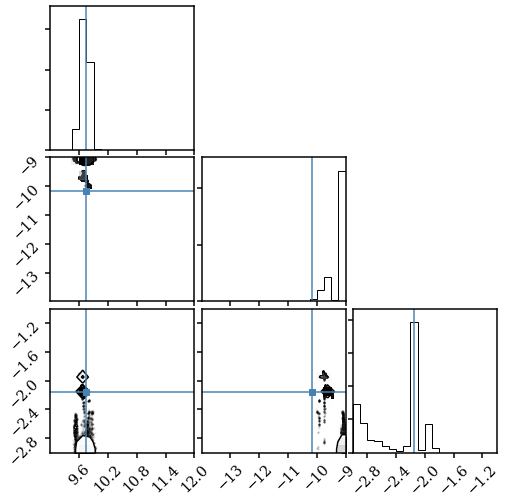

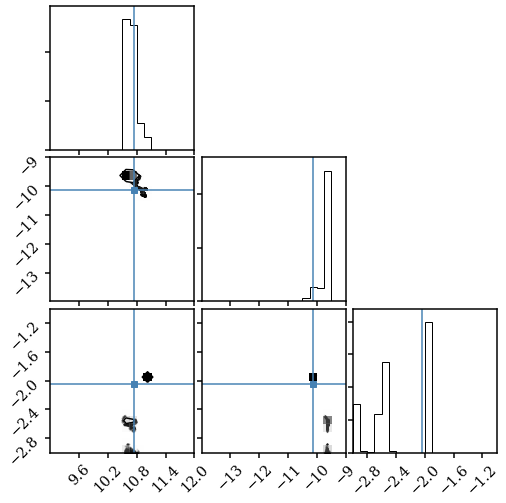

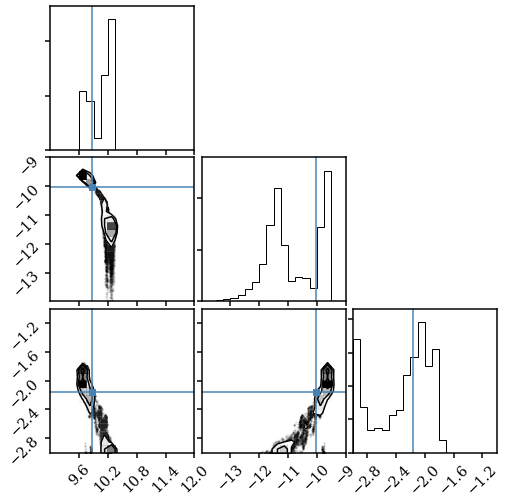

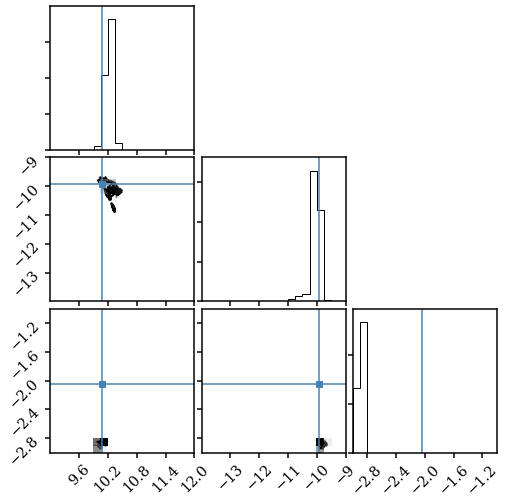

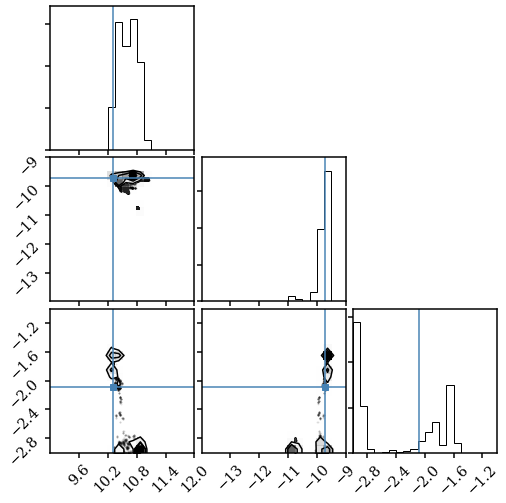

...

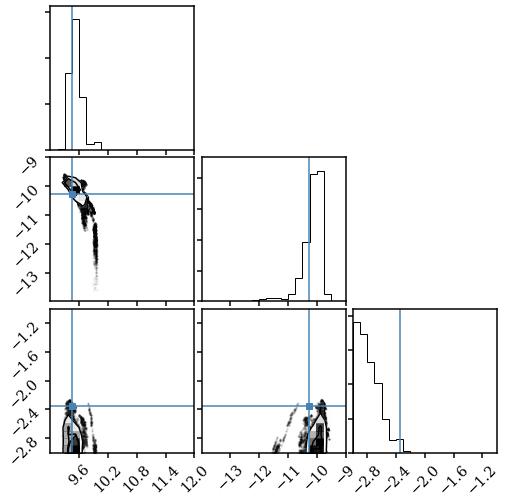

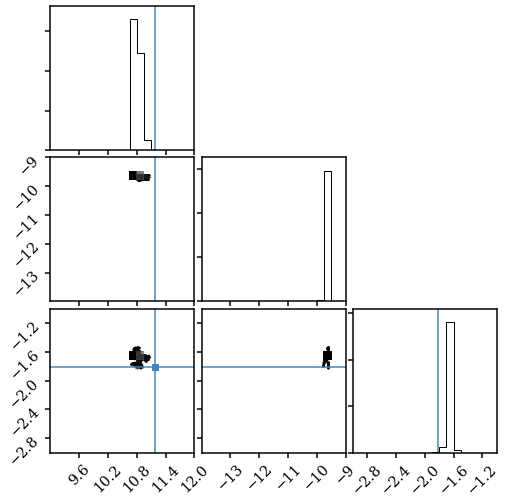

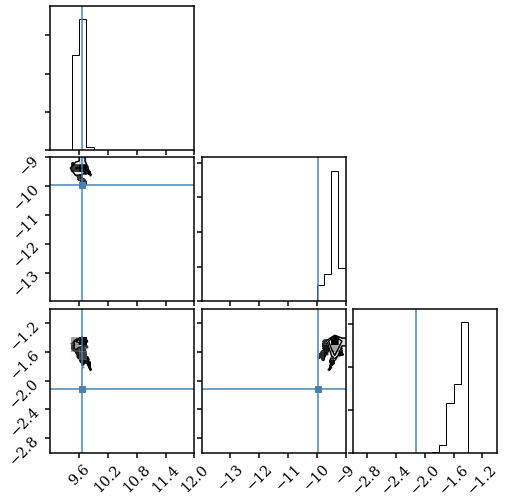

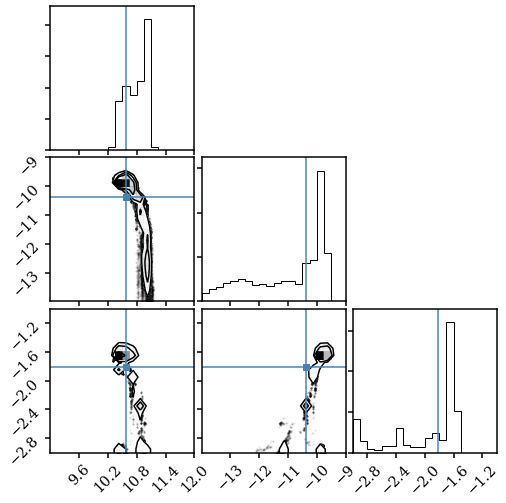

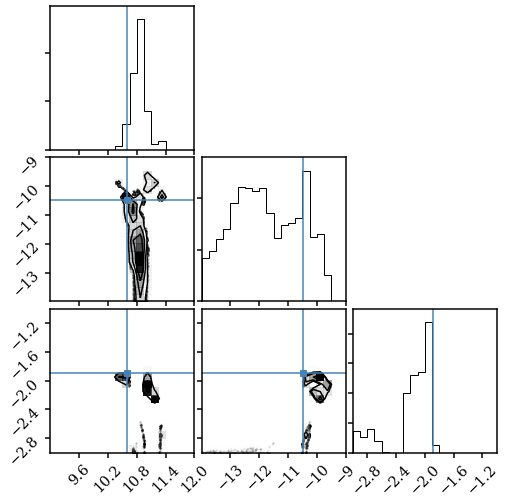

In [19]:
for i in np.arange(len(bad_ssfr))[bad_ssfr]: 
    print(i)
    theta_deriv = np.array([logMstar_inf[i], logSSFR_inf[i], logZ_MW_inf[i]])
    theta_true = np.array([logMstar_true[i], logSSFR_true[i], logZ_MW_true[i]])
    DFM.corner(theta_deriv.T, 
               truths=theta_true, 
              range=[(9, 12), (-14, -9.), (-3., -1)])

/global/homes/c/chahah/.conda/envs/gqp/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


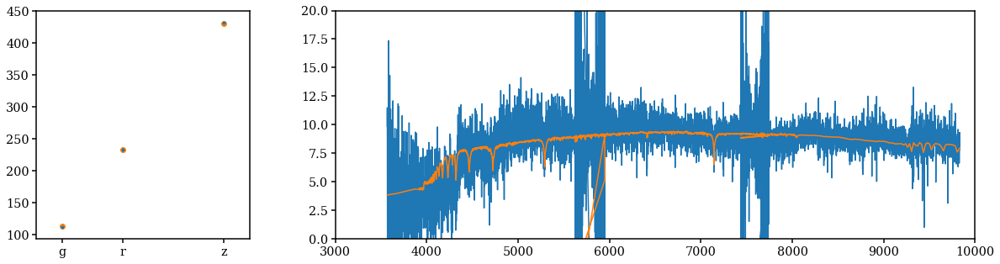

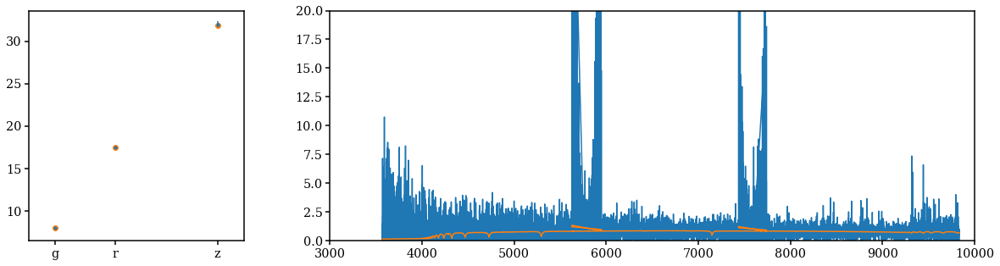

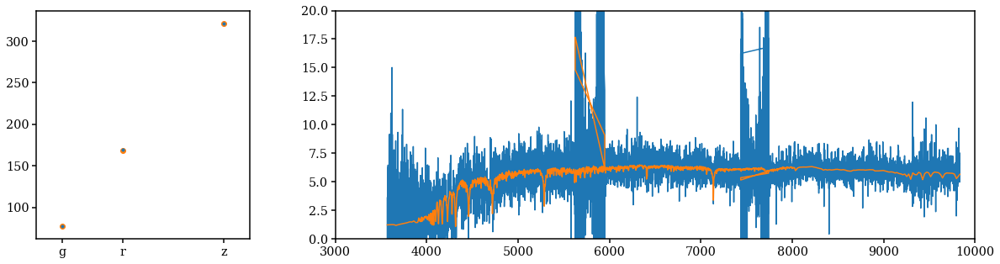

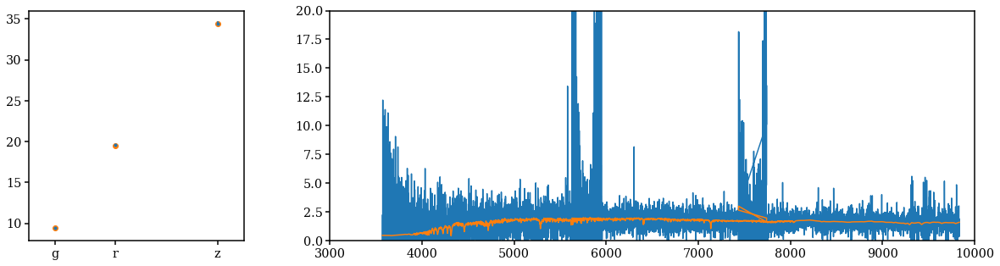

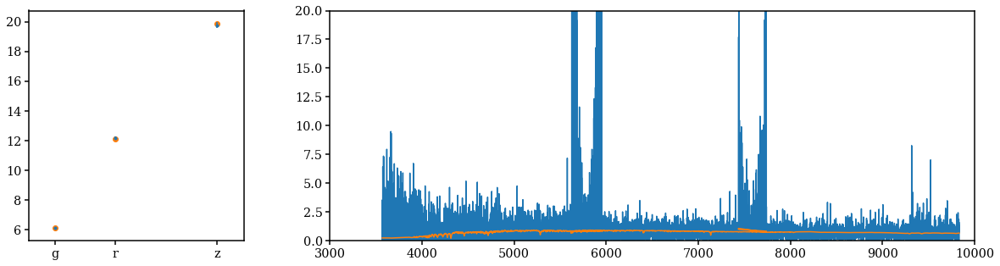

...

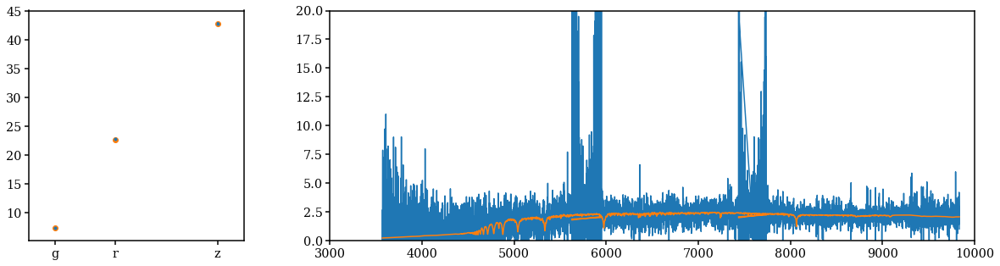

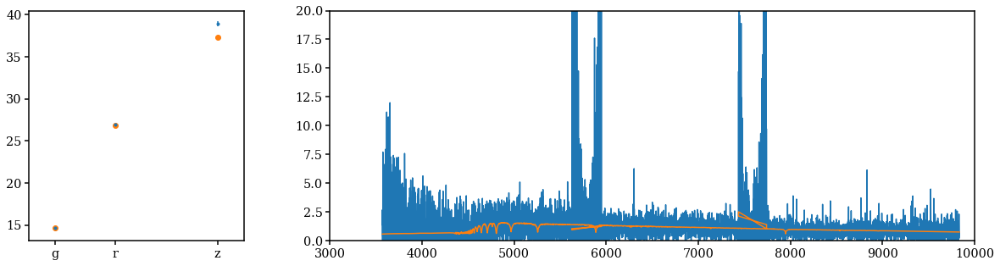

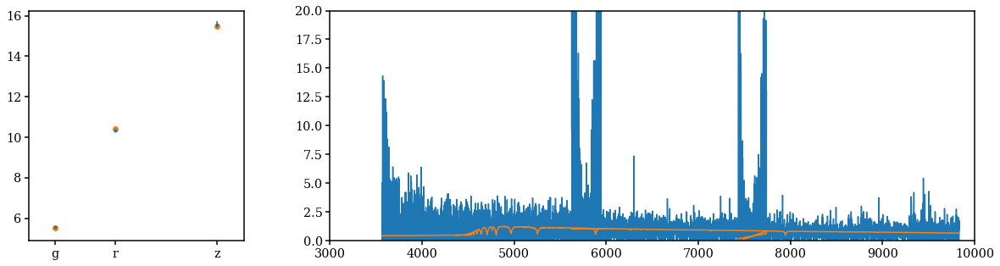

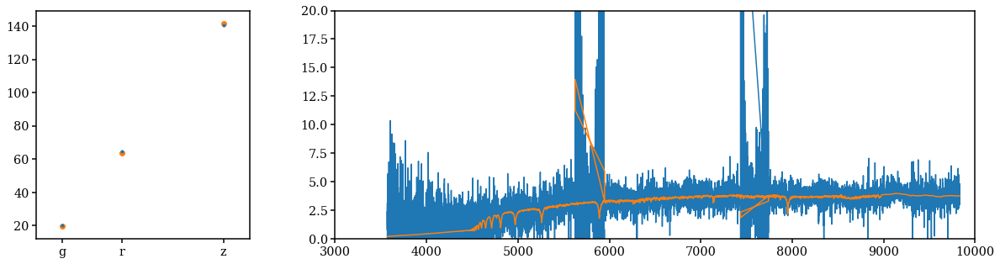

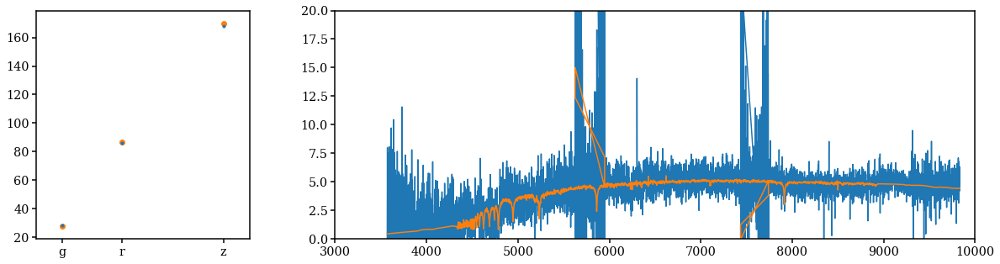

In [19]:
# examine the chains     
for i, igal in zip(np.array(igals)[bad_ssfr], np.arange(len(bad_ssfr))[bad_ssfr]): 
    fig = plt.figure(figsize=(20,5))
    gs2 = fig.add_gridspec(nrows=1, ncols=2, width_ratios=[1,3])#, top=0.17, bottom=0.05)
    sub1 = fig.add_subplot(gs2[0,0]) 
    sub2 = fig.add_subplot(gs2[0,1]) 
    sub1.errorbar([4720., 6415., 9260.], photo_obs[igal][:3], yerr=photo_ivar_obs[igal][:3]**-0.5, fmt='.C0')
    sub1.scatter([4720., 6415., 9260.], chains[i]['flux_photo_model'], c='C1')
    sub1.set_xlim(4000, 1e4)
    sub1.set_xticks([4720., 6415., 9260])
    sub1.set_xticklabels(['g', 'r', 'z'])


    sub2.plot(wave_obs, flux_obs[igal], c='C0')
    sub2.plot(chain['wavelength_obs'], chains[i]['flux_spec_model'], c='C1')
    sub2.set_xlim(3e3, 1e4)
    sub2.set_ylim(0., 20)